<div class="alert alert-block alert-success">
    <h1 align="center">Telecom Customer Churn Modelling</h1>
    <h4 align="center" >Alireza Esmaeilpour</h4>
    <h6 align="center"><a href="https://alireza-esp.ir/">Website</a></h6>
    <h6 align="center"><a href="https://github.com/Alireza-Esp">Github</a></h6>
    <h6 align="center"><a href="https://www.kaggle.com/alirezaesmaeilpour">Kaggle</a></h6>
</div>

# 🔵 Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import random

import warnings
warnings.filterwarnings('ignore')

# 🔵 Load the data

In [2]:
data = pd.read_csv("https://github.com/Alireza-Esp/Telecom-Customer-Churn-Modelling/raw/refs/heads/main/data/telecom-customer-churn-v1.csv")

# 🔵 Visualization

🟣 Plot the density of customers on the map respect to an indicator (here like Churn Label)...

* make new dataframe named "cities_density" for storing the density of customers on map respect to an indicator (here like Churn Label)...

In [3]:
cities_density = data[["City", "Churn Label", 'Latitude', 'Longitude']].groupby(by=["City"]).value_counts().to_frame()
cities_density.rename(columns={"count":"Count"}, inplace=True)
cities_density.reset_index(inplace=True)

In [4]:
cities_density

,City,Churn Label,Latitude,Longitude,Count
0,Acampo,Yes,38.200231,-121.235034,3
1,Acampo,No,38.200231,-121.235034,1
2,Acton,No,34.501452,-118.207862,4
3,Adelanto,No,34.667815,-117.536183,4
4,Adelanto,Yes,34.667815,-117.536183,1
...,...,...,...,...,...
2821,Yucaipa,No,34.045970,-117.011825,3
2822,Yucaipa,Yes,34.045970,-117.011825,1
2823,Yucca Valley,No,34.159534,-116.425984,5
2824,Zenia,No,40.170357,-123.417298,3


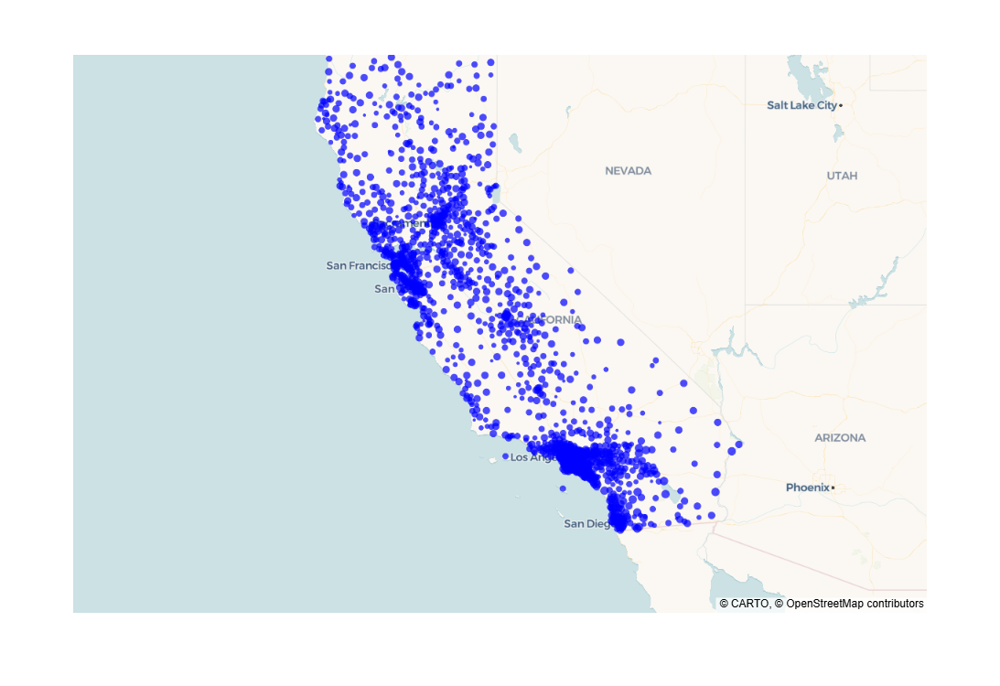

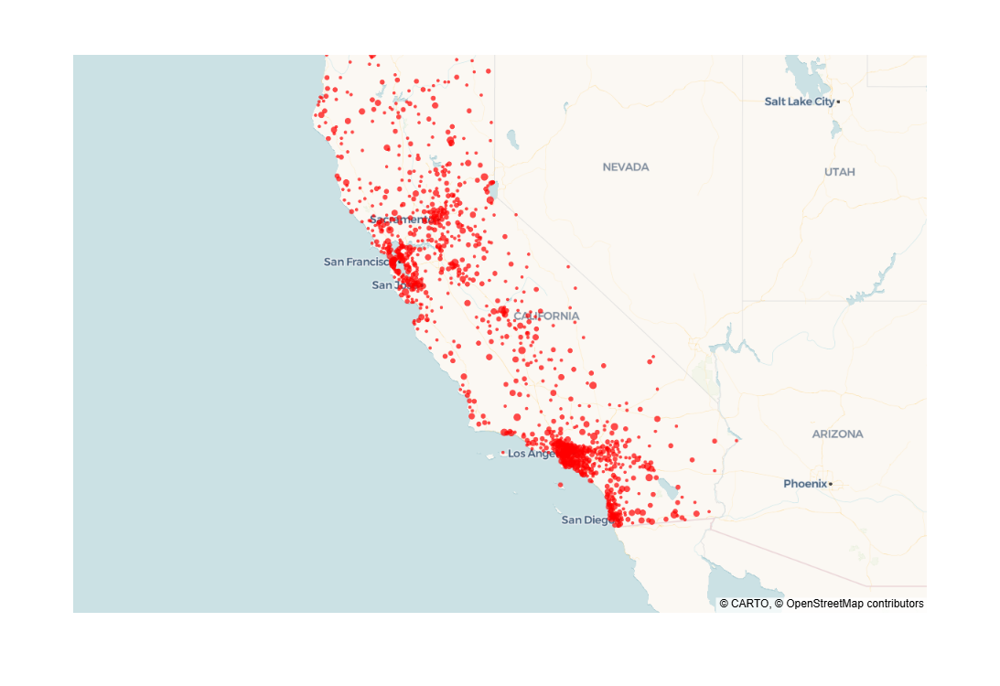

In [5]:
for stat,color in zip(["No","Yes"],["blue","red"]):
    px.scatter_map(data_frame=cities_density[cities_density["Churn Label"]==stat], lat="Latitude", lon="Longitude", hover_name="City",
                                             color_discrete_sequence=[color], size="Count", opacity=0.7, zoom=5, height=750, size_max=7
    ).show()

In [6]:
# --------- UPPER DATAFRAME IS MORE USEFUL ---------
#cities_density = data['City'].value_counts().reset_index()
#cities_density.columns = ['City', 'Count']
#cities_density = cities_density.merge(data.drop_duplicates(subset='City')[['City', 'Latitude', 'Longitude']], on='City', how='left')
#cities_density.rename(columns={"Count":"Density"}, inplace=True)

# --------- UPPER CODE IS MORE OPTIMAL ---------
#cities_density = data.City.value_counts().to_frame()
#cities_density.insert(loc=0, column="City", value=cities_density.index)
#cities_density.index = range(len(cities_density))
#lats = []
#longs = []
#for i in cities_density.City:
#    for index,j in enumerate(data.City, start=0):
#        if i==j:
#            lats.append(data.Latitude[index])
#            longs.append(data.Longitude[index])
#            break
#cities_density["Latitude"] = lats
#cities_density["Longitude"] = longs
#cities_density

🟣 Plot the counts of categorical features respect to each unique values and another categorical feature (here like Churn Label) ...

* Replace NaN values to "NULL" str to show in plots...

In [7]:
data[["Offer", "Churn Category", "Churn Reason"]] = data[["Offer", "Churn Category", "Churn Reason"]].fillna("NULL")

* Define a list of plotly.express color palettes to use in plotly charts...

In [8]:
color_palettes = [px.colors.qualitative.Alphabet, px.colors.qualitative.Antique, px.colors.qualitative.Bold, px.colors.qualitative.D3,
                  px.colors.qualitative.Dark2, px.colors.qualitative.Dark24, px.colors.qualitative.G10, px.colors.qualitative.Light24,
                  px.colors.qualitative.Pastel, px.colors.qualitative.Pastel1, px.colors.qualitative.Pastel2, px.colors.qualitative.Plotly,
                  px.colors.qualitative.Prism, px.colors.qualitative.Safe, px.colors.qualitative.Set1, px.colors.qualitative.Set2,
                  px.colors.qualitative.Set3, px.colors.qualitative.T10, px.colors.qualitative.Vivid]

* Split usefull categorical and numerical data for plotting...

In [9]:
categorical_columns = []
numerical_columns = []

for i in data.columns:
    if data[i].dtype=="object":
        categorical_columns.append(i)
    else:
        numerical_columns.append(i)

numerical_columns.remove("Latitude")
numerical_columns.remove("Longitude")
categorical_columns.remove("City")

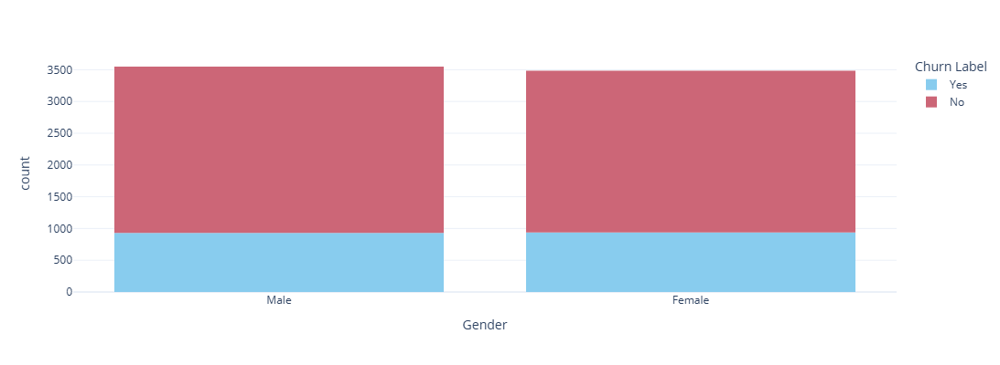

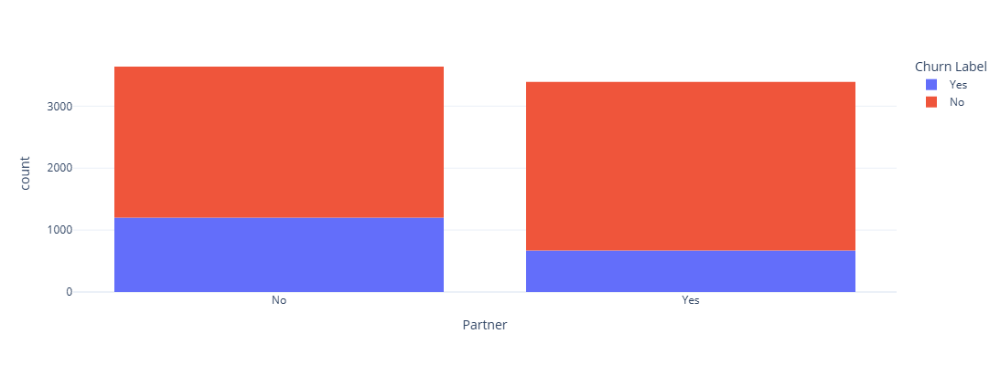

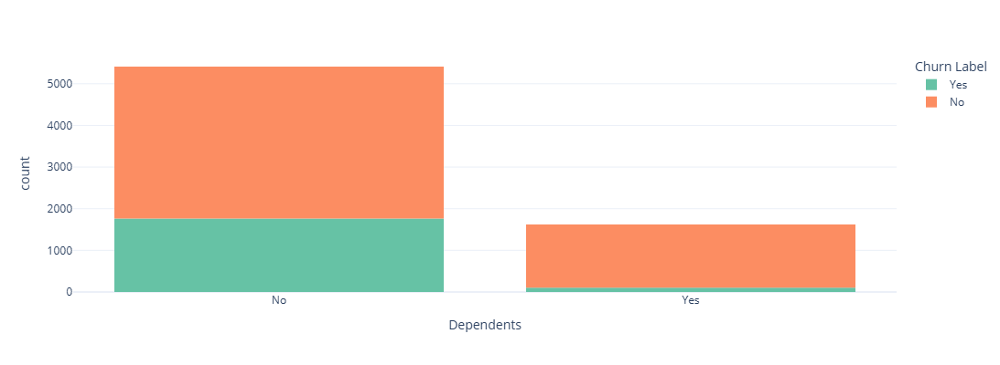

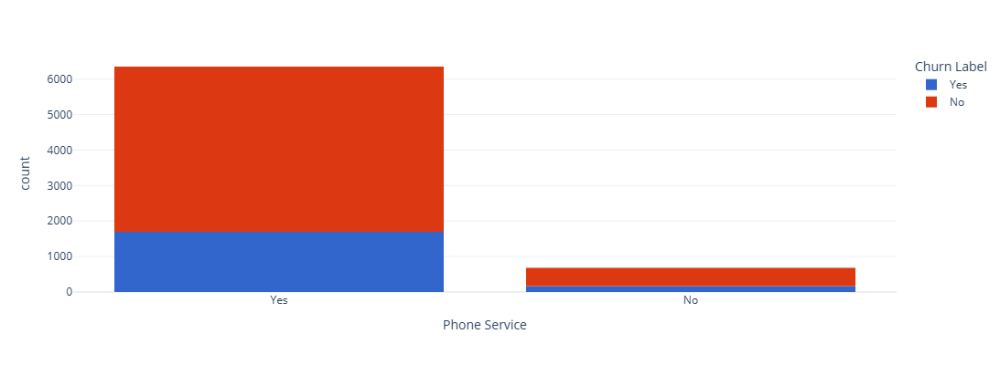

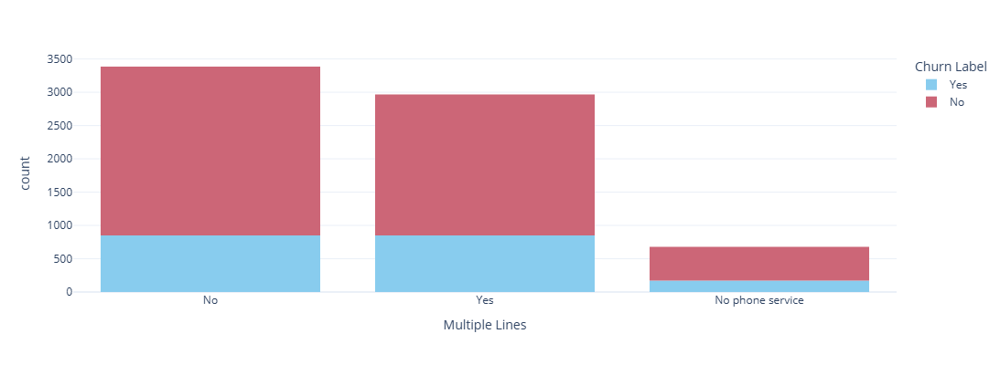

...

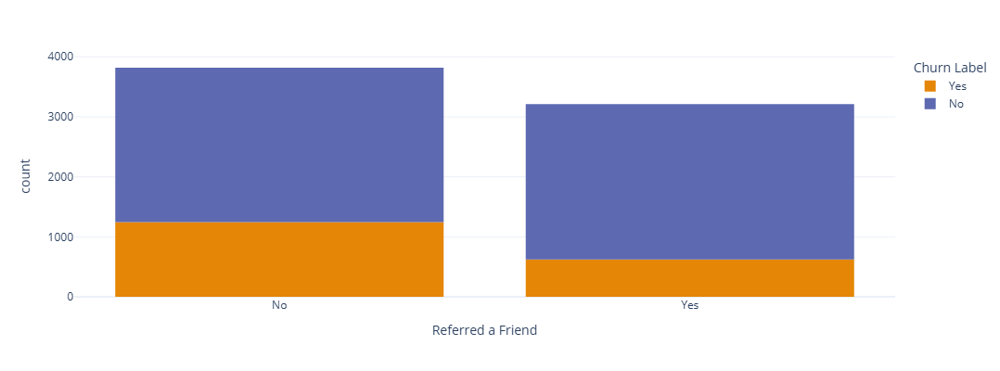

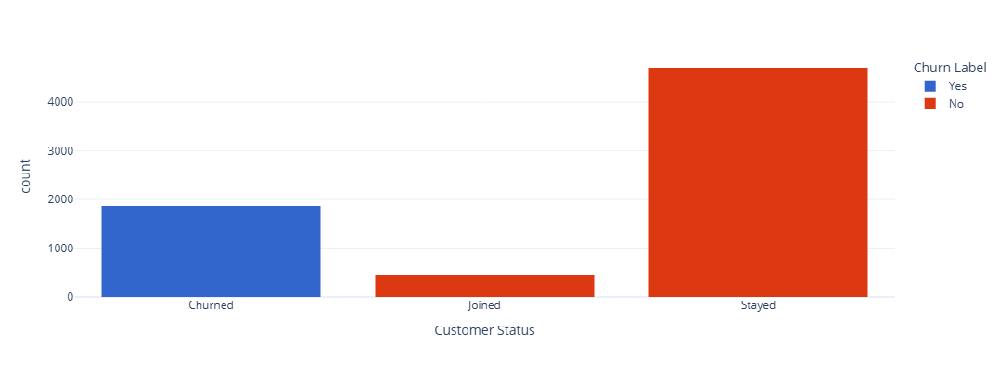

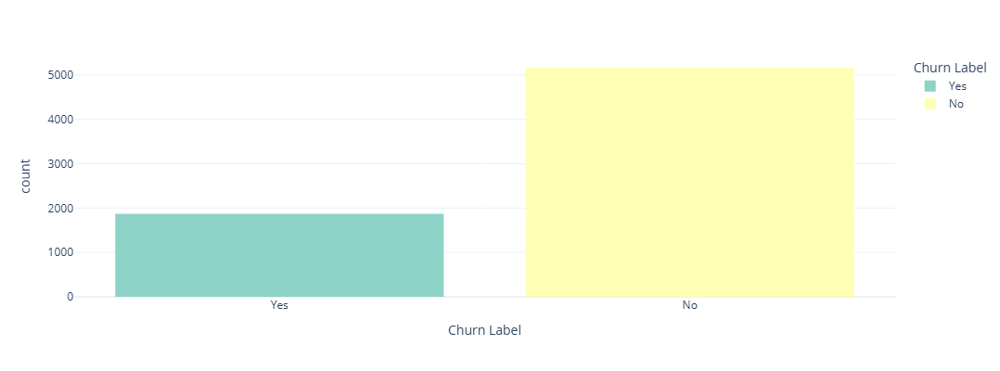

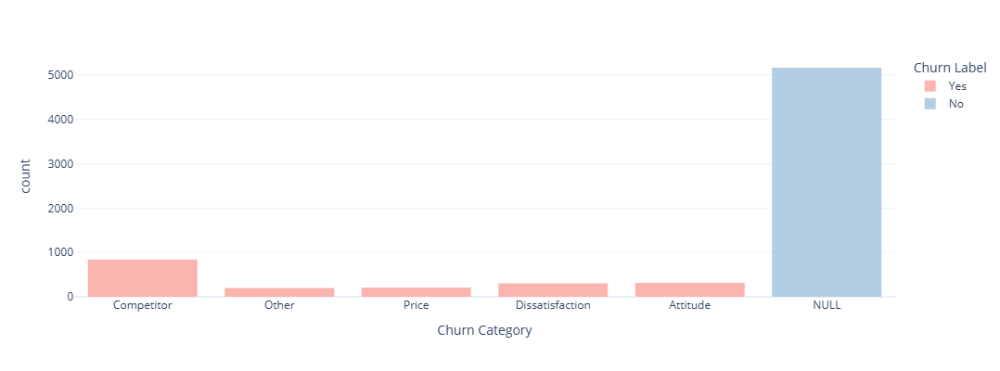

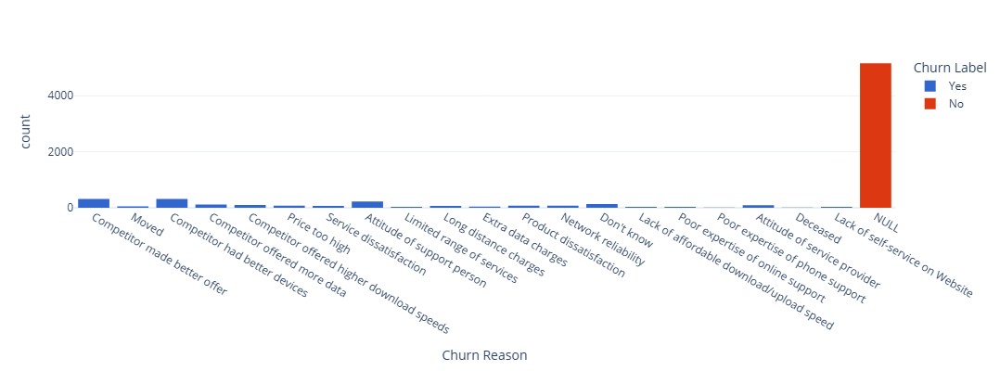

In [10]:
for col in categorical_columns:
    plot = px.histogram(data_frame=data, x=col, color="Churn Label", color_discrete_sequence=random.choice(color_palettes),
                        width=600, height=400, template="plotly_white")
    plot.show()

🟣 Plot the sum of a numerical feature (here like Tenure Months) respect to unique values of a categorical features...

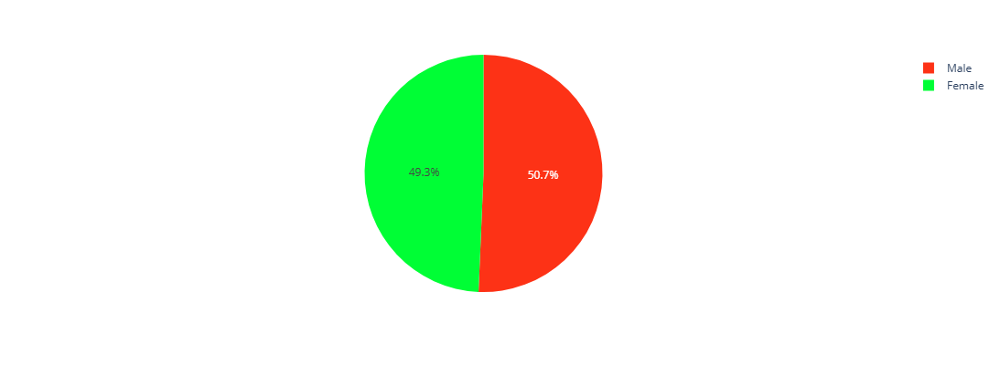

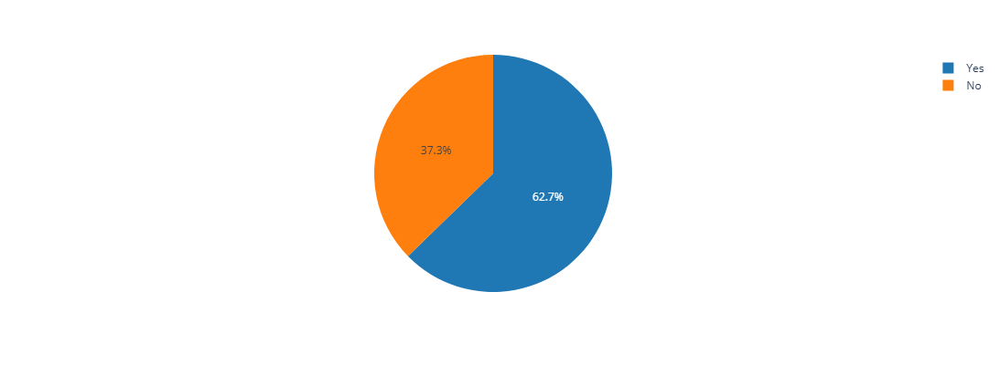

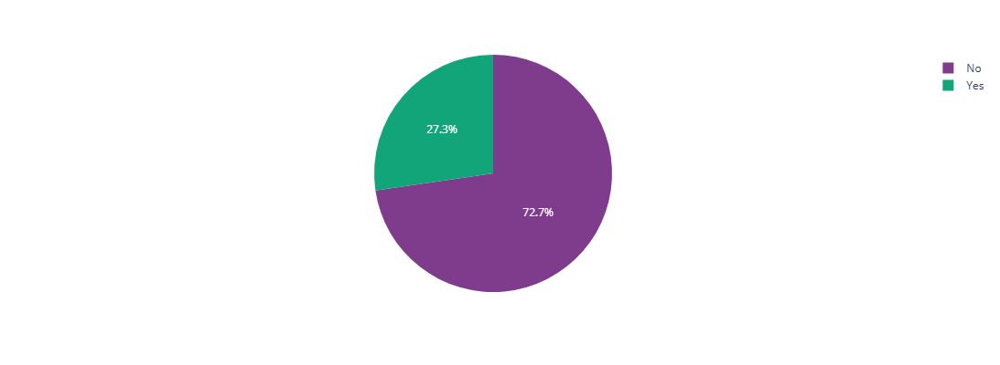

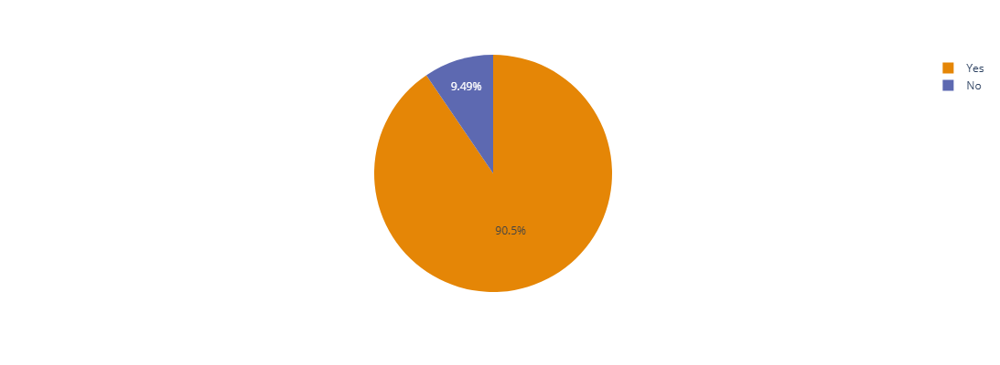

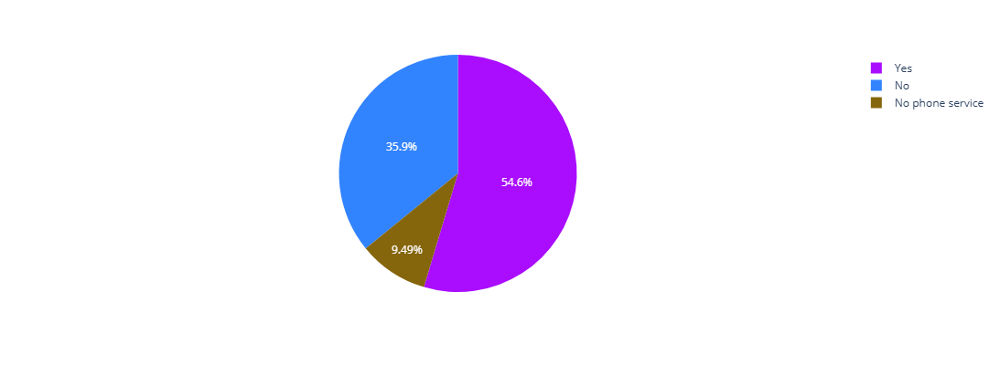

...

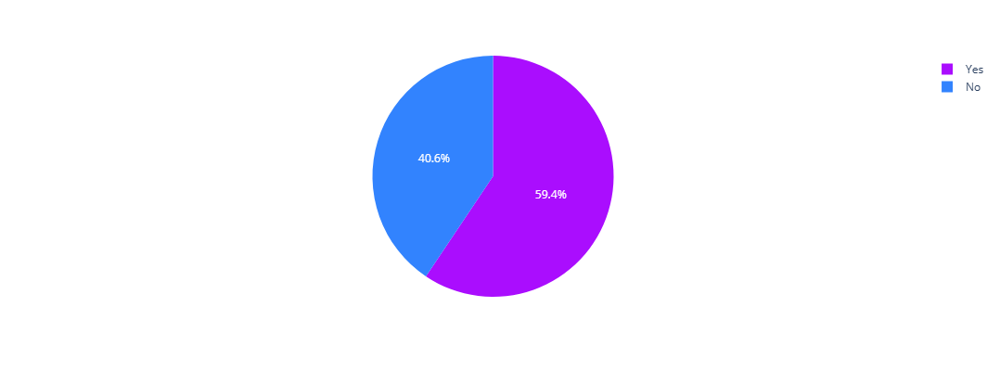

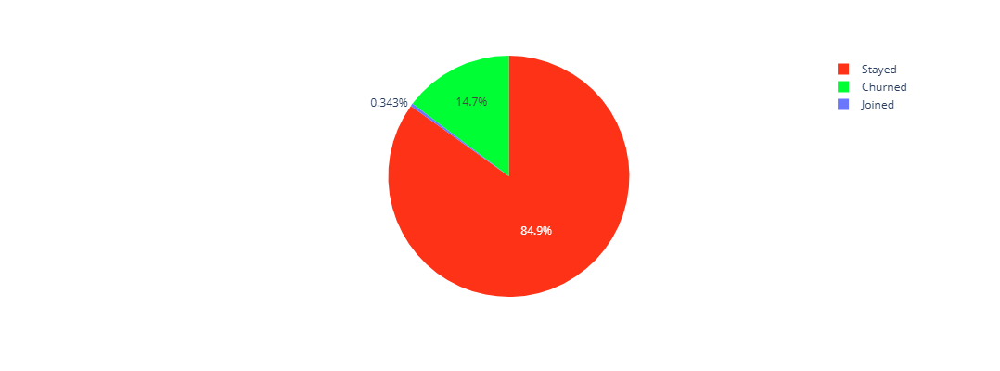

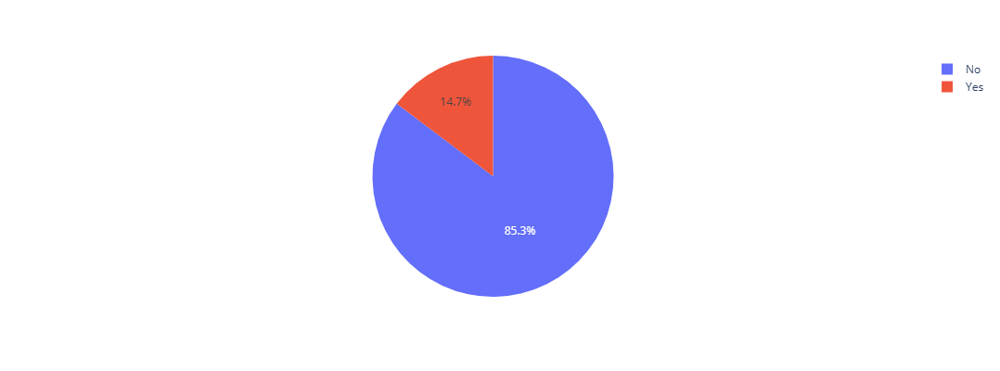

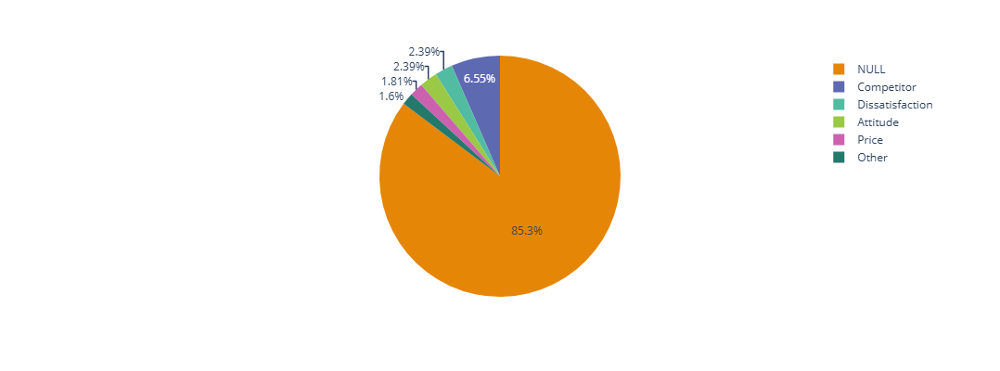

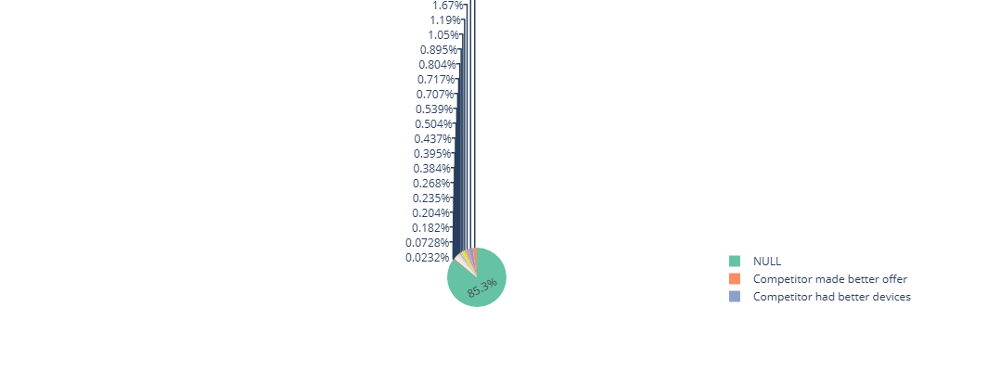

In [11]:
for col in categorical_columns:
    plot = px.pie(data_frame=data, names=col, values="Tenure Months", color_discrete_sequence=random.choice(color_palettes),
                        width=600, height=400, template="plotly_white")
    plot.show()

🟣 Plot the distribution of a numerical feature (here like Tenure Months) relative to a categorical features...

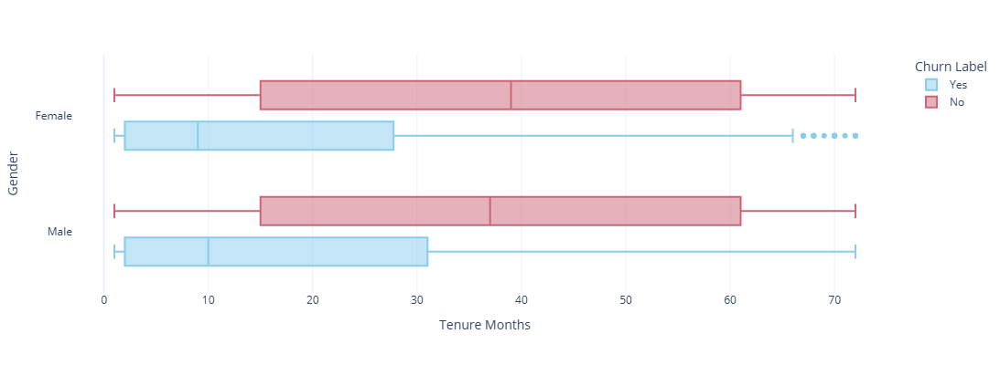

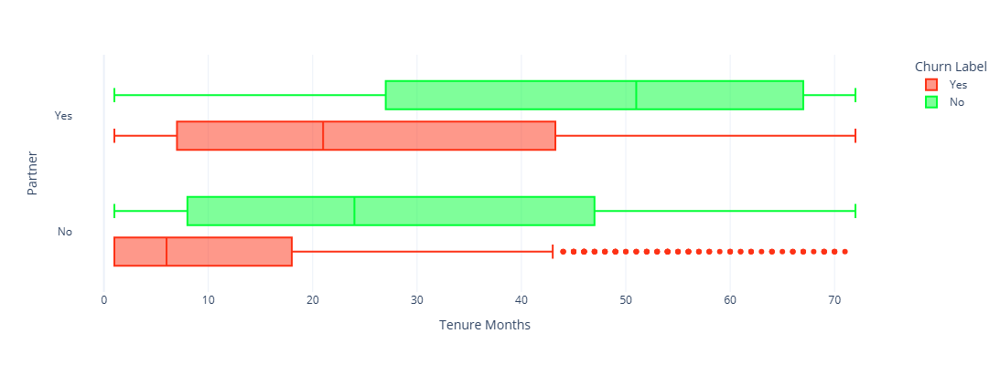

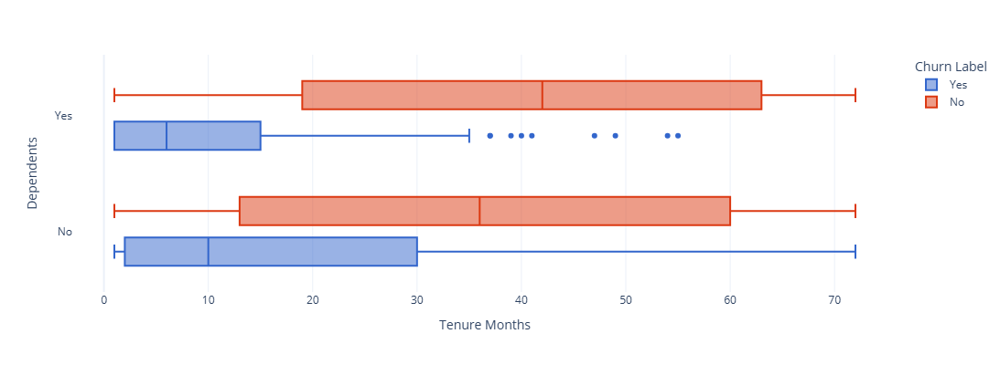

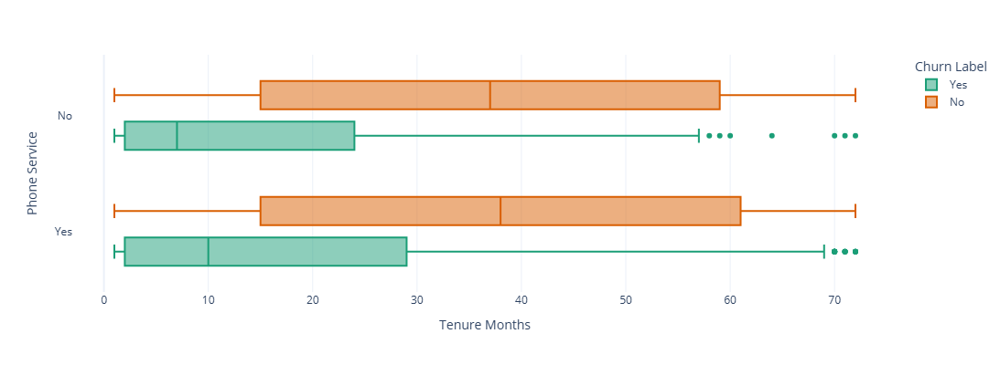

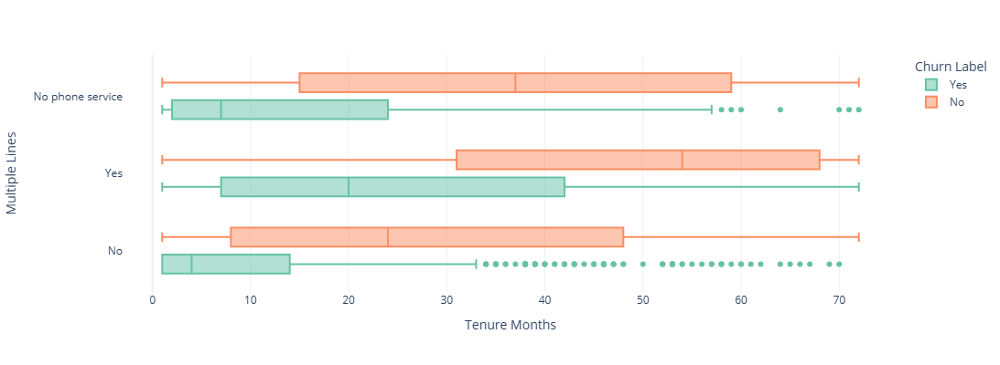

...

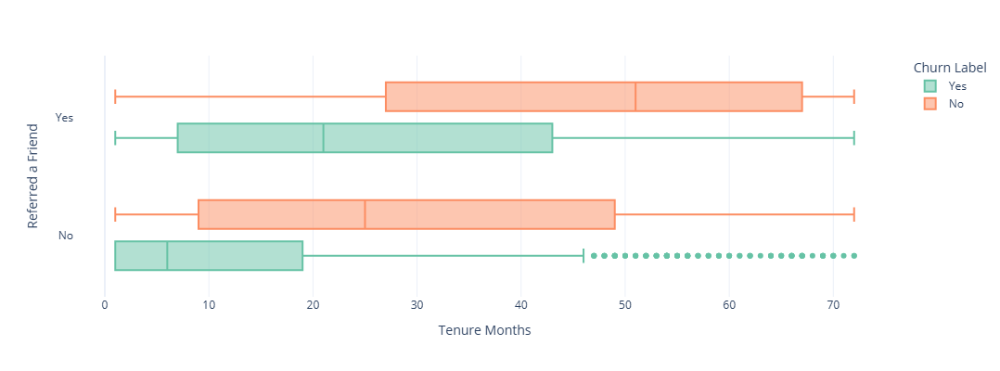

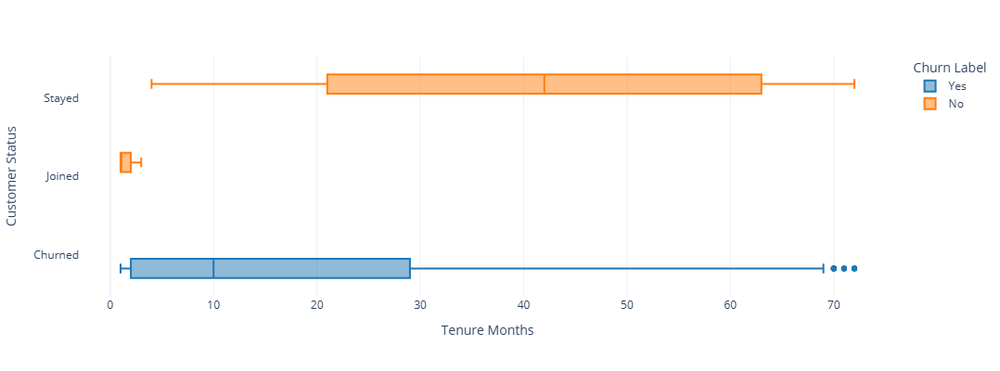

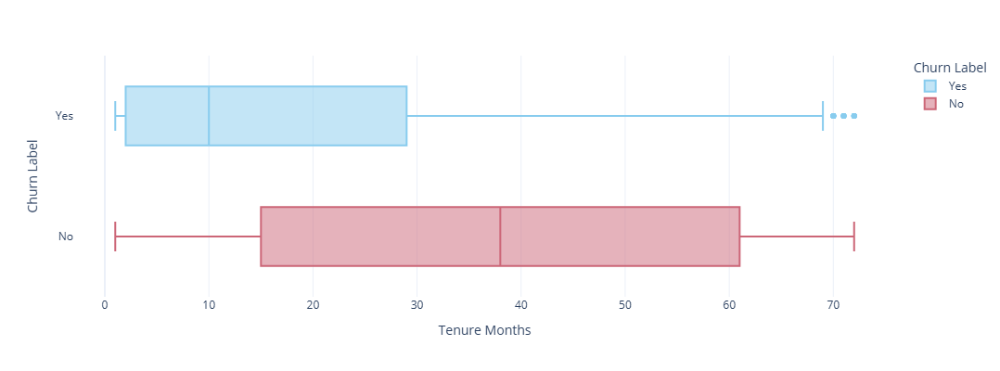

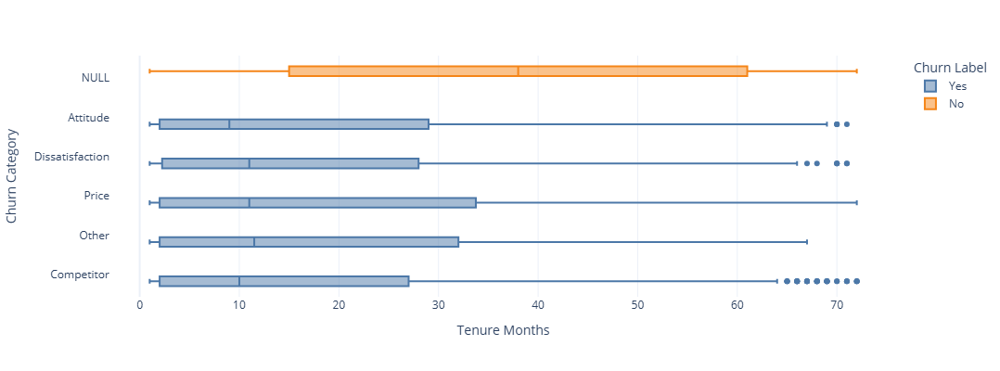

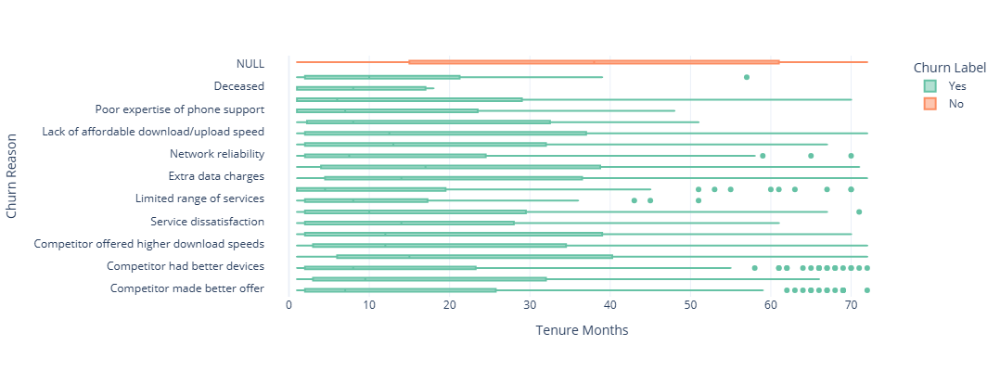

In [12]:
for col in categorical_columns:
    plot = px.box(data_frame=data, y=col, x="Tenure Months",  color="Churn Label", color_discrete_sequence=random.choice(color_palettes),
                        width=600, height=400, template="plotly_white")
    plot.show()

🟣 Plot the distribution of two numerical features relative to each others (here like Monthly Charges and others)...

* Define a color scales list to use in plotly.express charts...

In [13]:
color_scales = ["blues", "greens", "purples",]

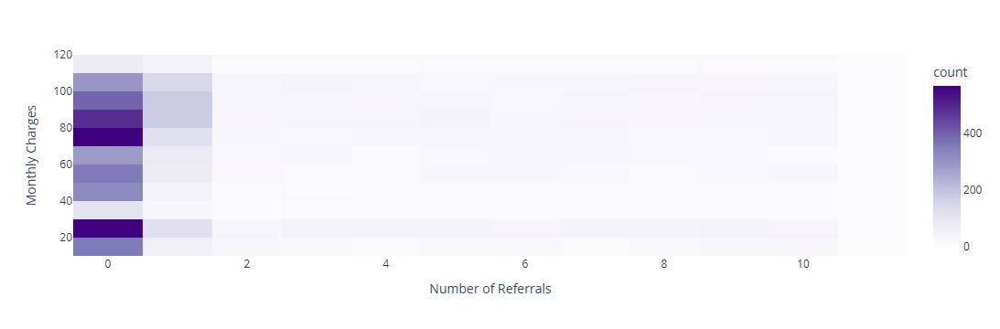

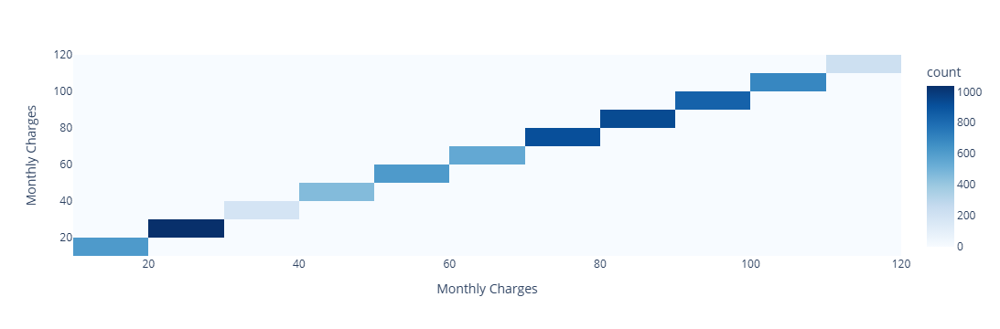

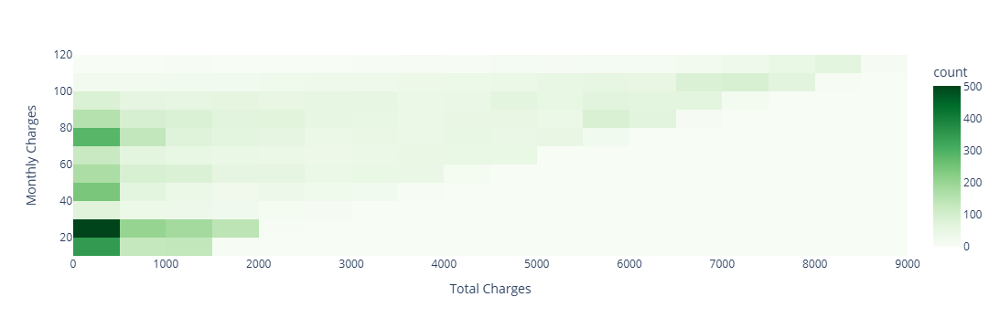

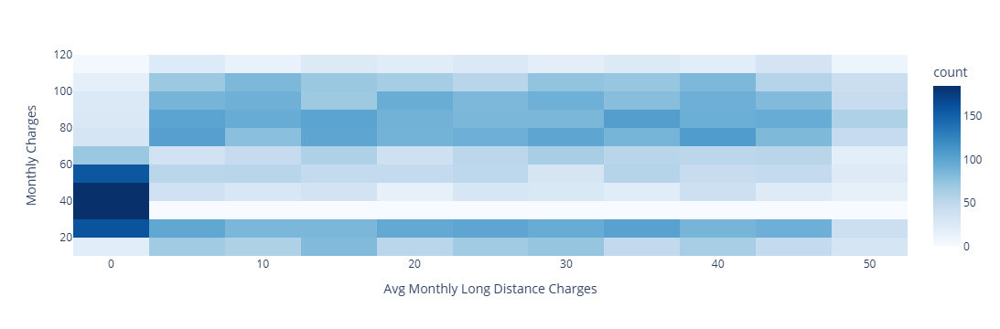

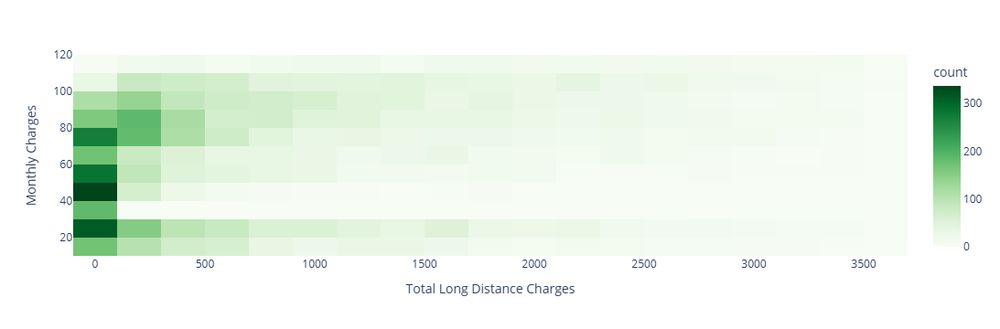

...

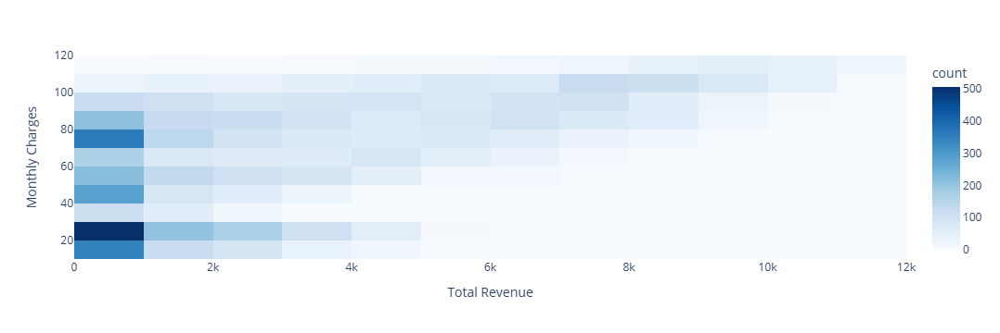

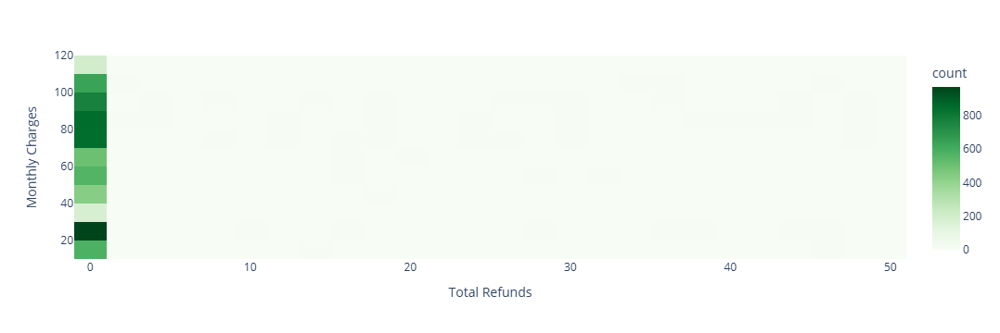

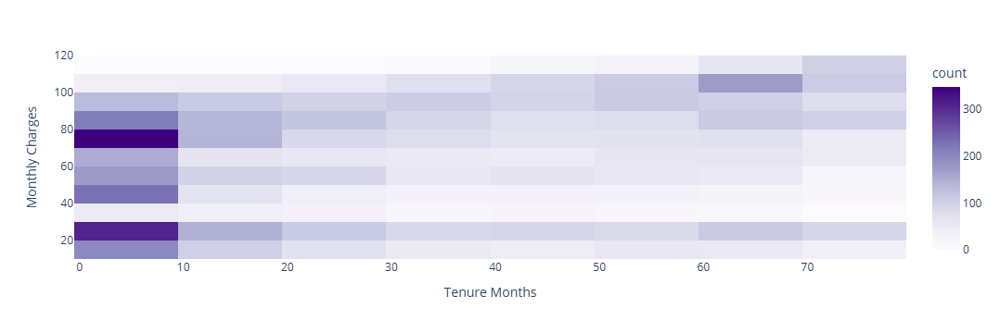

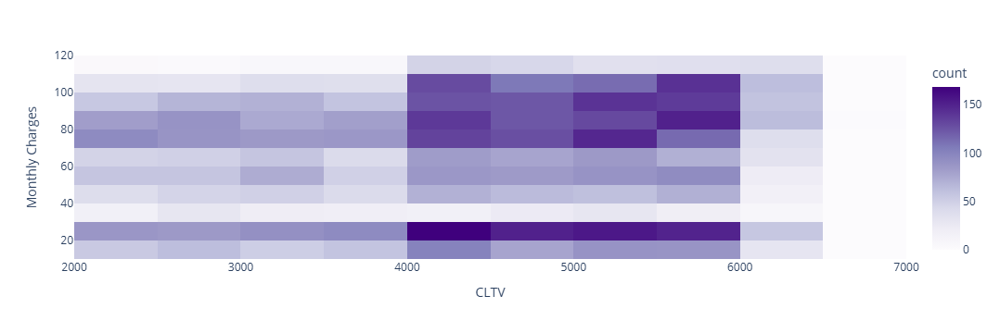

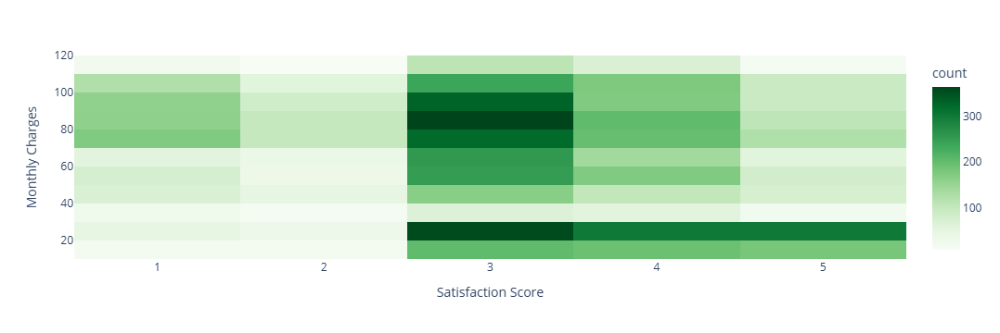

In [14]:
for col in numerical_columns:
    plot = px.density_heatmap(data_frame=data, x=col, y="Monthly Charges", color_continuous_scale=random.choice(color_scales), width=700)
    plot.show()

# 🔵 Save the data

In [15]:
with open(file="../data/telecom-customer-churn-v2.csv", mode="w", encoding="utf-8") as file_path:
    data.to_csv(path_or_buf=file_path, index=False, lineterminator="\n")